# Exploring the Latent Space of the VAE

This script analyzes the latent space representations of a Variational Autoencoder (VAE) trained on a pineapple dataset. We examine the effect of different KL divergence weights (`β`) on the latent space structure:

- `β = 1.0`: Full KL divergence (standard VAE)  
- `β = 0.75`, `0.50`, `0.25`: Partial KL contribution  
- `β = 0.0`: Equivalent to a standard autoencoder (no KL term)

The dataset includes three subsets for evaluation:
- **Foreground**: Cropped regions containing pineapples  
- **Background**: Areas without pineapples  
- **Full images**: Entire input images including both foreground and background

This comparison helps understand how varying the KL term influences the VAE’s encoding capability across different visual contexts.


## Implications of Latent Space Size

- **Too Small**: An undersized latent space may force the model to compress multiple factors into single dimensions, leading to entangled representations where changes in one latent variable affect multiple aspects of the output. This compression can result in poor reconstruction quality and limited control over generated outputs.

- **Too Large**: An oversized latent space can introduce redundancy, where multiple dimensions capture the same factor, or allow the model to ignore certain dimensions altogether. This scenario can lead to overfitting, where the model memorizes training data without learning meaningful representations, and may cause instability during training.


## Imports

In [1]:
from torch.utils.data import Dataset, DataLoader

import pandas as pd
import torch
import os 
import cv2
import numpy as np
import matplotlib.pyplot as plt

from dataset import PineappleCountDataset
from VAE import VAE
from utils import plot_samples, load_models

In [2]:
device = "cuda"

## Load checkpoints Model

Structure of the models dictionary:

```
models = {
    'last': {'kl_1_00': model, 'kl_0_25': model, ...},
    'mid': {'kl_1_00': model, 'kl_0_25': model, ...},
    'init': {'kl_1_00': model, 'kl_0_25': model, ...},
}
```

In [3]:
checkpoints_by_stage = {
    'last': {
        'kl_0_00': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@0.00/weights_ck_398.pt',
        'kl_0_25': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@0.25/weights_ck_399.pt',
        'kl_0_50': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@0.50/weights_ck_398.pt',
        'kl_0_75': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@0.75/weights_ck_398.pt',
        'kl_1_00': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@1.00/weights_ck_398.pt',
    },
    'mid': {
        'kl_0_00': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@0.00/weights_ck_200.pt',
        'kl_0_25': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@0.25/weights_ck_200.pt',
        'kl_0_50': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@0.50/weights_ck_200.pt',
        'kl_0_75': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@0.75/weights_ck_200.pt',
        'kl_1_00': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@1.00/weights_ck_200.pt',
    },
    'init': {
        'kl_0_00': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@0.00/weights_ck_0.pt',
        'kl_0_25': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@0.25/weights_ck_0.pt',
        'kl_0_50': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@0.50/weights_ck_0.pt',
        'kl_0_75': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@0.75/weights_ck_0.pt',
        'kl_1_00': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@1.00/weights_ck_0.pt',
    }
}

models = load_models(VAE=VAE, device=device, checkpoints_by_stage=checkpoints_by_stage)

## Check dataset

**Sampling Modes for Visualizing Images**

This section allows you to visualize image samples from the pineapple dataset using different modes. Each mode controls how the images are selected and displayed:

- **`foreground`**: Displays only the labeled regions containing pineapples (i.e., objects of interest).

- **`background`**: Displays only the labeled regions without pineapples (i.e., background or non-object areas).

- **`full`**: Displays the entire labeled images, including both foreground (pineapples) and background.

- **`combined`**: Displays all available images, including both labeled and unlabeled data. Useful for understanding the overall dataset distribution.

- **`random`**: Displays a random selection of images, regardless of label or content. Useful for general exploration or sanity checks.

In [4]:
dataset_path = "/home/rtxmsi1/Downloads/VAE_training-master (2)/VERTICAL_IMAGES_FG_BG_FULL_LABELS"
csv_path = "/home/rtxmsi1/Downloads/VAE_training-master (2)/DATASET.csv"

In [5]:
df = pd.read_csv(csv_path)
dataset_pineapple = PineappleCountDataset(train=True, train_ratio=0.1, 
                                          root_dir=dataset_path,
                                          resize_shape=(256, 256),
                                          dataframe=df)

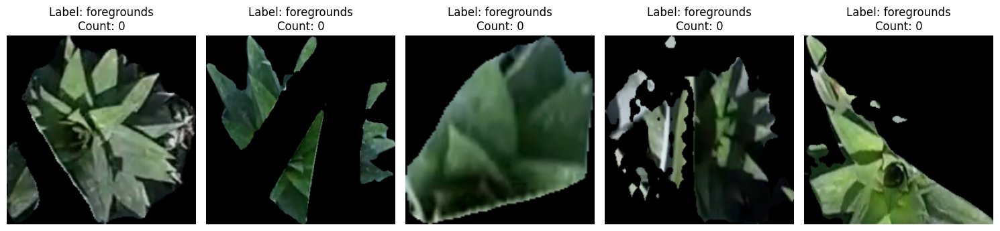

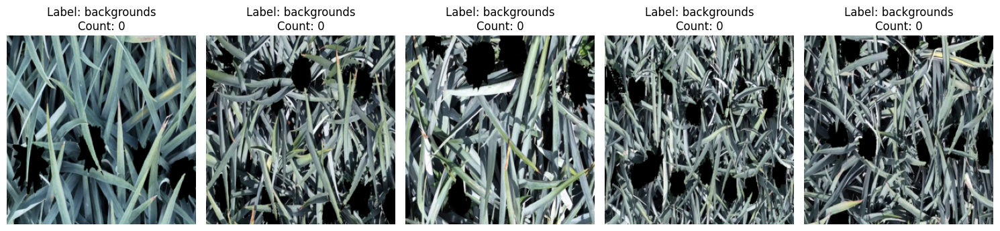

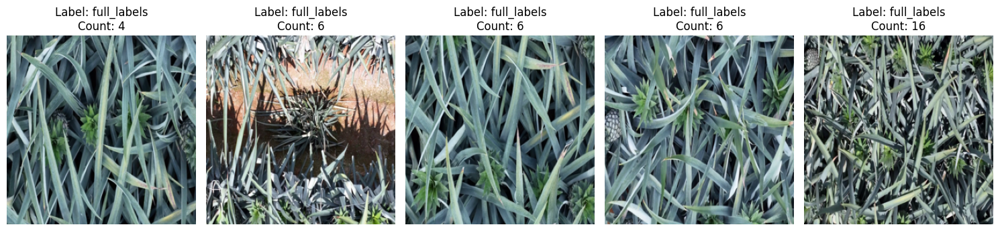

In [6]:
# Plot 5 foreground samples
plot_samples(dataset_pineapple, n=5, sample_type='foreground')
# Plot 5 background samples
plot_samples(dataset_pineapple, n=5, sample_type='background')
# Plot 5 full samples
plot_samples(dataset_pineapple, n=5, sample_type='full')

## Check reconstructions

In [7]:
from utils import visualize_reconstructions_dict, extract_latents, plot_latents_all_models, plot_latents_all_models_3d_plotly, plot_latents_all_models_3d

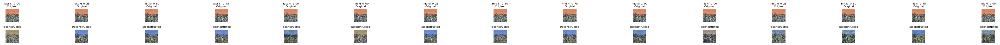

In [8]:
visualize_reconstructions_dict(
    models_dict=models,
    test_set=dataset_pineapple,
    num_samples=1,
    device=device,
    img="image"
)

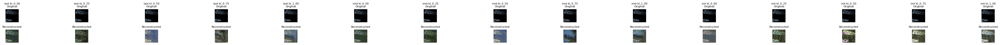

In [9]:
visualize_reconstructions_dict(
    models_dict=models,
    test_set=dataset_pineapple,
    num_samples=1,
    device=device,
    img="image"
)

## Check the latent space

In [10]:
models['last']['kl_0_00']

VAE(
  (encoder): VAE_Encoder(
    (0): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): VAE_ResidualBlock(
      (groupnorm_1): GroupNorm(32, 128, eps=1e-05, affine=True)
      (conv_1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (groupnorm_2): GroupNorm(32, 128, eps=1e-05, affine=True)
      (conv_2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (residual_layer): Identity()
    )
    (2): VAE_ResidualBlock(
      (groupnorm_1): GroupNorm(32, 128, eps=1e-05, affine=True)
      (conv_1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (groupnorm_2): GroupNorm(32, 128, eps=1e-05, affine=True)
      (conv_2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (residual_layer): Identity()
    )
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2))
    (4): VAE_ResidualBlock(
      (groupnorm_1): GroupNorm(32, 128, eps=1e-05, affine=True)
      (conv

In [6]:
label_colors = {0: 'blue', 1: 'green', 2: 'red'}
label_names = dataset_pineapple.label_to_text

dataset_pineapple.label_to_text

{0: 'backgrounds', 1: 'foregrounds', 2: 'full_labels'}

## Latent space visualization 

The model was trained for 400 epochs. The following checkpoints were saved:

- **Last**: The final checkpoint corresponds to epoch 399, although the best-performing epoch may be either 398 or 399.
- **Mid**: The midpoint checkpoint corresponds to epoch 200.
- **Init**: The initial checkpoint corresponds to epoch 0.

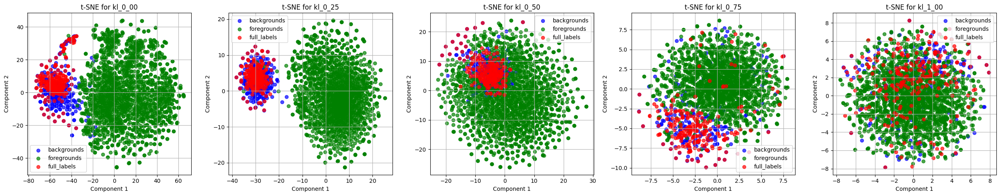

In [13]:
plot_latents_all_models(models['last'], dataset_pineapple, label_names, label_colors, device=device)

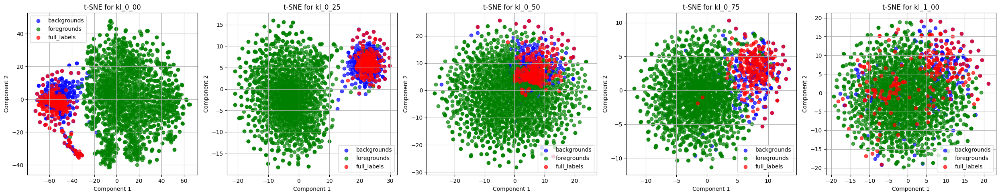

In [14]:
plot_latents_all_models(models['mid'], dataset_pineapple, label_names, label_colors, device=device)

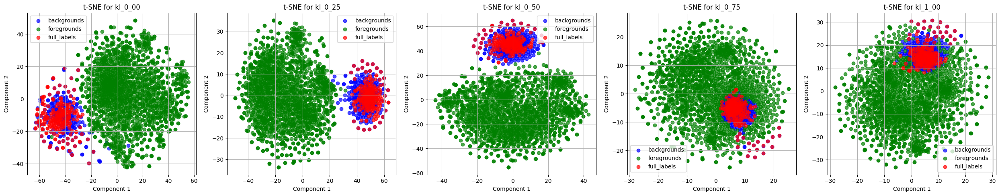

In [15]:
plot_latents_all_models(models['init'], dataset_pineapple, label_names, label_colors, device=device)

### How full image interacts?

In [ ]:
filtered_test_dataset = [sample for sample in dataset_pineapple if sample['label'] != 1]

In [ ]:
plot_latents_all_models(models['last'], filtered_test_dataset, label_names, label_colors, device=device)

In [ ]:
plot_latents_all_models(models['mid'], filtered_test_dataset, label_names, label_colors, device=device)

In [ ]:
plot_latents_all_models(models['init'], filtered_test_dataset, label_names, label_colors, device=device)

#### Plot in 3D

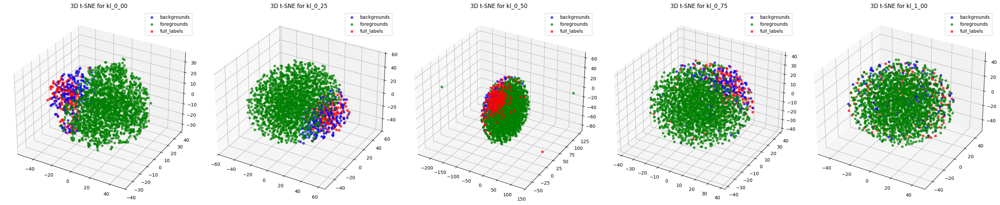

In [8]:
plot_latents_all_models_3d(models['last'], dataset_pineapple, label_names, label_colors, device=device)

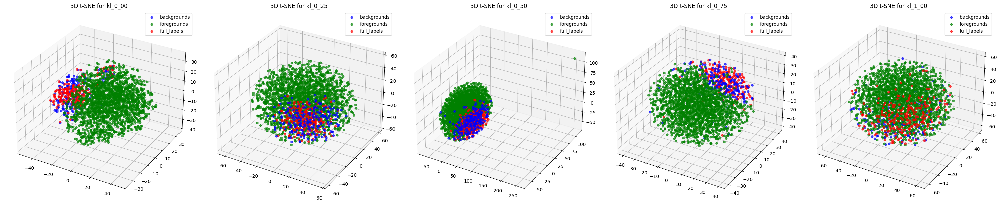

In [9]:
plot_latents_all_models_3d(models['mid'], dataset_pineapple, label_names, label_colors, device=device)

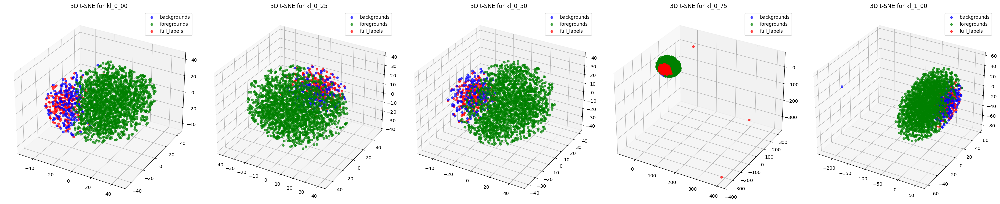

In [10]:
plot_latents_all_models_3d(models['init'], dataset_pineapple, label_names, label_colors, device=device)

#### Plot in 3D with plotly

In [11]:
plot_latents_all_models_3d_plotly(models['last'], dataset_pineapple, label_names, label_colors, device=device)

In [12]:
plot_latents_all_models_3d_plotly(models['mid'], dataset_pineapple, label_names, label_colors, device=device)

In [13]:
plot_latents_all_models_3d_plotly(models['init'], dataset_pineapple, label_names, label_colors, device=device)

## Plot bin counts pineapple

In [16]:
dataset_pineapple.label_to_text

{0: 'backgrounds', 1: 'foregrounds', 2: 'full_labels'}

In [21]:
full_label_testset = [sample for sample in dataset_pineapple if sample['label'] == 2]

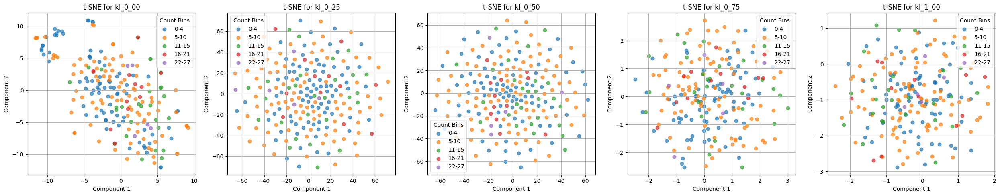

In [24]:
plot_latents_with_count(models['last'], full_label_testset, device=device)

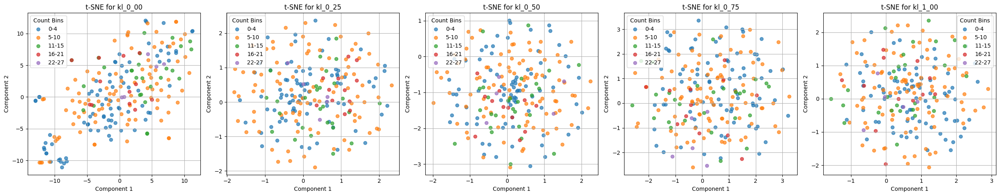

In [22]:
plot_latents_with_count(models['mid'], full_label_testset, device=device)

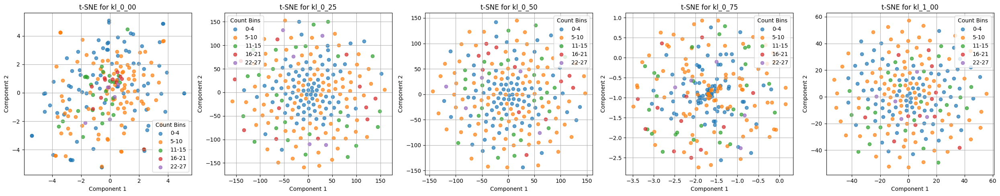

In [23]:
plot_latents_with_count(models['init'], full_label_testset, device=device)

### Train classifier Multilayer Perceptron (MLP) classifier 

- Classifier for the original flatten latent space.
- The model consists of an input layer, a hidden layer with ReLU activation, and an output layer designed for three-class. 
- To evaluate the model’s performance, a training and evaluation function is provided that uses stratified 5-fold cross-validation. 
- Trained for 20 epochs, batch size of 32, using stratified kfold to preserve the percentage of samples for each class in each fold.

In [25]:
from utils import train_evaluate_mlp

In [26]:
df = pd.read_csv(csv_path)
dataset_pineapple = PineappleCountDataset(train=True, train_ratio=1.0, 
                                          root_dir=dataset_path,
                                          resize_shape=(256, 256),
                                          dataframe=df)

In [ ]:
models_level = models['init']

for i, (name, model) in enumerate(models_level.items()):
    print(f"Model layer: {name}")
    data_cleaned, label_cleaned = extract_latents(model, dataset_pineapple, target_key="label", device=device)
    f1_scores = train_evaluate_mlp(data_cleaned, label_cleaned)
    print(f1_scores)

Model layer: kl_0_00
Fold 1: F1 Score = 0.7965
Fold 2: F1 Score = 0.7594
Fold 3: F1 Score = 0.7760
Fold 4: F1 Score = 0.7789
Fold 5: F1 Score = 0.7966

Average F1 Score over 5 folds: 0.7815
[0.7965370510263252, 0.759422025563978, 0.7760011989490078, 0.7789462325762472, 0.7965710727813136]
Model layer: kl_0_25
Fold 1: F1 Score = 0.8173
Fold 2: F1 Score = 0.8088
Fold 3: F1 Score = 0.8143
Fold 4: F1 Score = 0.8144
Fold 5: F1 Score = 0.8193

Average F1 Score over 5 folds: 0.8148
[0.8172930974036952, 0.8087602027128394, 0.814255255460396, 0.8144231229668725, 0.8192560445168464]
Model layer: kl_0_50


In [ ]:
models_level = models['mid']
for i, (name, model) in enumerate(models_level.items()):
    print(f"Model layer: {name}")
    data_cleaned, label_cleaned = extract_latents(model, dataset_pineapple, target_key="label", device=device)
    f1_scores = train_evaluate_mlp(data_cleaned, label_cleaned)
    print(f1_scores)

Model layer: kl_0_00
Fold 1: F1 Score = 0.9324
Fold 2: F1 Score = 0.9171
Fold 3: F1 Score = 0.9204
Fold 4: F1 Score = 0.9234
Fold 5: F1 Score = 0.9255

Average F1 Score over 5 folds: 0.9237
[0.9323636087303186, 0.9170702723871939, 0.9203523968612578, 0.923387944920055, 0.9254642435373747]
Model layer: kl_0_25
Fold 1: F1 Score = 0.6974
Fold 2: F1 Score = 0.6737
Fold 3: F1 Score = 0.7040
Fold 4: F1 Score = 0.7012
Fold 5: F1 Score = 0.7058

Average F1 Score over 5 folds: 0.6964
[0.697442067698058, 0.6737433461467414, 0.7039598803292026, 0.7011501862880962, 0.7057855276632683]
Model layer: kl_0_50
Fold 1: F1 Score = 0.6428
Fold 2: F1 Score = 0.6370
Fold 3: F1 Score = 0.6546
Fold 4: F1 Score = 0.6364
Fold 5: F1 Score = 0.6464

Average F1 Score over 5 folds: 0.6434
[0.6427641453857631, 0.6370014340314168, 0.6546009183520701, 0.636374328309721, 0.6464129465066067]
Model layer: kl_0_75
Fold 1: F1 Score = 0.6650
Fold 2: F1 Score = 0.6579
Fold 3: F1 Score = 0.6480
Fold 4: F1 Score = 0.6504
Fold 

In [ ]:
models_level = models['last']
for i, (name, model) in enumerate(models_level.items()):
    print(f"Model layer: {name}")
    data_cleaned, label_cleaned = extract_latents(model, dataset_pineapple, target_key="label", device=device)
    f1_scores = train_evaluate_mlp(data_cleaned, label_cleaned)
    print(f1_scores)

Model layer: kl_0_00
Fold 1: F1 Score = 0.9272
Fold 2: F1 Score = 0.9202
Fold 3: F1 Score = 0.9192
Fold 4: F1 Score = 0.9175
Fold 5: F1 Score = 0.9084

Average F1 Score over 5 folds: 0.9185
[0.9272415063560628, 0.9201732769213521, 0.9191967790117842, 0.917490820172561, 0.9083933755486798]
Model layer: kl_0_25
Fold 1: F1 Score = 0.6911
Fold 2: F1 Score = 0.7040
Fold 3: F1 Score = 0.6754
Fold 4: F1 Score = 0.7175
Fold 5: F1 Score = 0.7130

Average F1 Score over 5 folds: 0.7002
[0.6910734087812919, 0.7039833222538242, 0.6754021102065746, 0.7175350704107055, 0.7130002806053873]
Model layer: kl_0_50
Fold 1: F1 Score = 0.6372
Fold 2: F1 Score = 0.6426
Fold 3: F1 Score = 0.6380
Fold 4: F1 Score = 0.6295
Fold 5: F1 Score = 0.6481

Average F1 Score over 5 folds: 0.6391
[0.6371630024112688, 0.6426473429205078, 0.6380305716700613, 0.6295495005632045, 0.6481314068040391]
Model layer: kl_0_75
Fold 1: F1 Score = 0.6339
Fold 2: F1 Score = 0.6507
Fold 3: F1 Score = 0.6221
Fold 4: F1 Score = 0.6298
Fol